In [1]:
import gdal
import numpy as np
from scipy.stats import linregress
from sklearn import linear_model
from scipy.stats import linregress
import pylab as plt
from scipy import optimize
%matplotlib inline

Due to the effects of aot on red and green bands shoud be smaller, a smaller residual threshold is used in the ransac function to better separate the outliers. From the results, these two bands show simiar results like blue bands.

In [2]:
def ransaclin(x,y):
    y, x = y.reshape((len(y),1)), x.reshape((len(x),1))
    model = linear_model.LinearRegression()
    model.fit(x, y)

    model_ransac = linear_model.RANSACRegressor(linear_model.LinearRegression(),max_trials=10000000, residual_threshold=0.002)
    model_ransac.fit(x, y)
    inlier_mask = model_ransac.inlier_mask_
    return x[inlier_mask], y[inlier_mask], inlier_mask

### Green band

In [3]:
sr_b3 = gdal.Open('data/LC81220342016070LGN00_sr_band3.tif').ReadAsArray(2000, 2000, 1000, 1000)*0.0001
toa_b3 = gdal.Open('data/LC81220342016070LGN00_toa_band3.tif').ReadAsArray(2000, 2000, 1000, 1000)*0.0001

(0, 0.3)

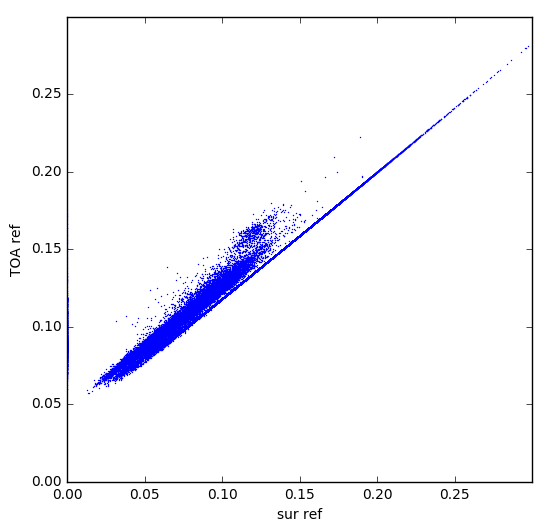

In [4]:
plt.figure(figsize=(6,6))
plt.plot(sr_b3.ravel(), toa_b3.ravel(), 'o', mew=0, ms=1)
plt.xlabel('sur ref')
plt.ylabel('TOA ref')
plt.xlim(0,0.3)
plt.ylim(0,0.3)

(0, 0.3)

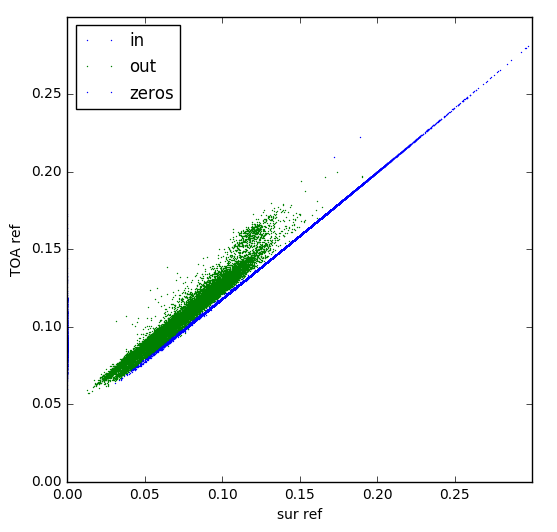

In [5]:
sr_in, toa_in, in_mask = ransaclin(sr_b3.ravel(), toa_b3.ravel())#get the values as well as the mask
in_mask = in_mask | (toa_b3.ravel()>0.2) # only focus on low reflectance pixels
zeros = (sr_b3.ravel()<0.01)
out_mask = (~in_mask) & (~zeros)
plt.figure(figsize=(6,6))
plt.plot(sr_b3.ravel()[in_mask], toa_b3.ravel()[in_mask], 'bo', mew=0, ms=1, label='in')
plt.plot(sr_b3.ravel()[out_mask], toa_b3.ravel()[out_mask], 'go', mew=0, ms=1, label='out')
plt.plot(sr_b3.ravel()[zeros], toa_b3.ravel()[zeros], 'o', mew=0, ms=1, label='zeros')
plt.legend(loc = 'best')
plt.xlabel('sur ref')
plt.ylabel('TOA ref')
plt.xlim(0,0.3)
plt.ylim(0,0.3)

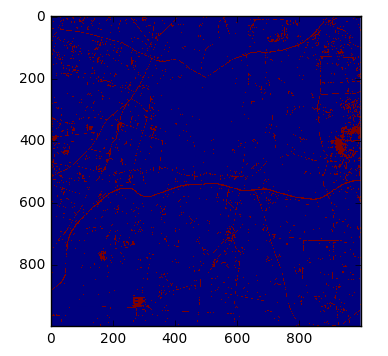

In [6]:
plt.imshow(out_mask.reshape(1000, 1000), interpolation='None') # plot the ouliers mask

In [7]:
# to compose a rgb image check the locations
toa_rgb = [gdal.Open('data/LC81220342016070LGN00_toa_band%d.tif'%band).ReadAsArray(2000, 2000, 1000, 1000)*0.0001 for band in [4,3,2]]
sur_rgb = [gdal.Open('data/LC81220342016070LGN00_sr_band%d.tif'%band).ReadAsArray(2000, 2000, 1000, 1000)*0.0001 for band in [4,3,2]]

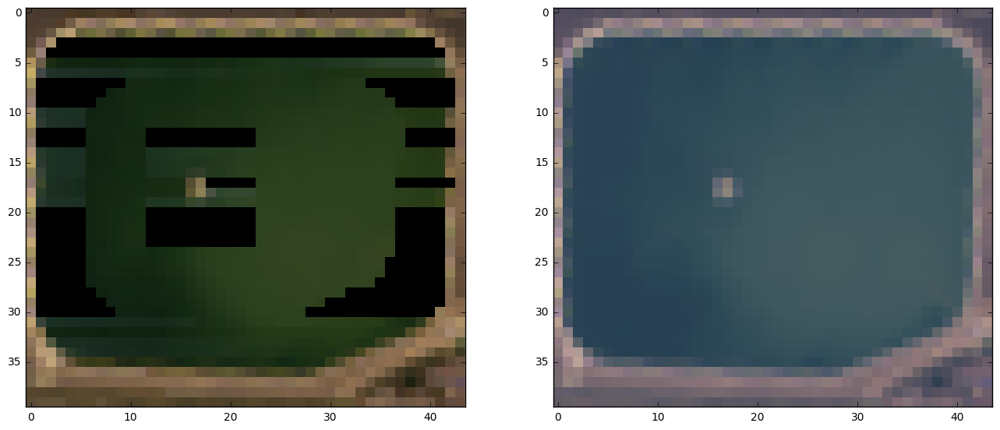

In [8]:
# an illustration of zeros values in surface reflectance over a lake or a pond...
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(1,2,1)
ax1.imshow((np.array(sur_rgb)[:,900:940, 260:304]).transpose(1,2,0)*3, interpolation='None')
ax2 = fig.add_subplot(1,2,2)
ax2.imshow((np.array(toa_rgb)[:,900:940, 260:304]).transpose(1,2,0)*3, interpolation='None')

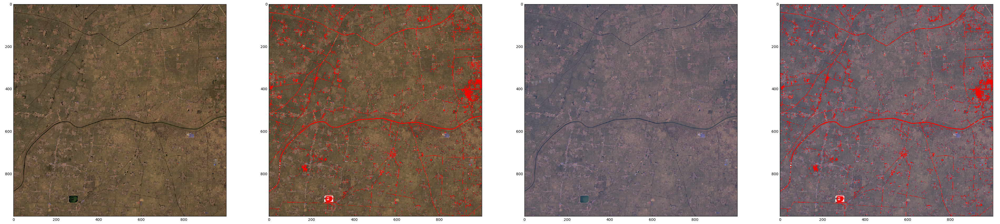

In [9]:
sur = np.array(sur_rgb).transpose(1,2,0)
toa = np.array(toa_rgb).transpose(1,2,0)
temp = sur.copy()
temp[(out_mask).reshape((1000,1000)),1:]=0 # use red to show those pixels
temp[(out_mask).reshape((1000,1000)),0]=1 # with outliers values
temp[(zeros).reshape((1000,1000)),:]=1 # show zeros surface reflectance pixels
temp1 = toa.copy()
temp1[(out_mask).reshape((1000,1000)),1:]=0
temp1[(out_mask).reshape((1000,1000)),0]=1
temp1[(zeros).reshape((1000,1000)),:]=1


fig = plt.figure(figsize=(48,12))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(sur*3, interpolation='None')
ax2 = fig.add_subplot(1,4,2)
ax2.imshow(temp*3, interpolation='None')
ax3 = fig.add_subplot(1,4,3)
ax3.imshow(toa*3, interpolation='None')
ax4 = fig.add_subplot(1,4,4)
ax4.imshow(temp1*3, interpolation='None')

### Red band

In [10]:
sr_b4 = gdal.Open('data/LC81220342016070LGN00_sr_band4.tif').ReadAsArray(2000, 2000, 1000, 1000)*0.0001
toa_b4 = gdal.Open('data/LC81220342016070LGN00_toa_band4.tif').ReadAsArray(2000, 2000, 1000, 1000)*0.0001

(0, 0.3)

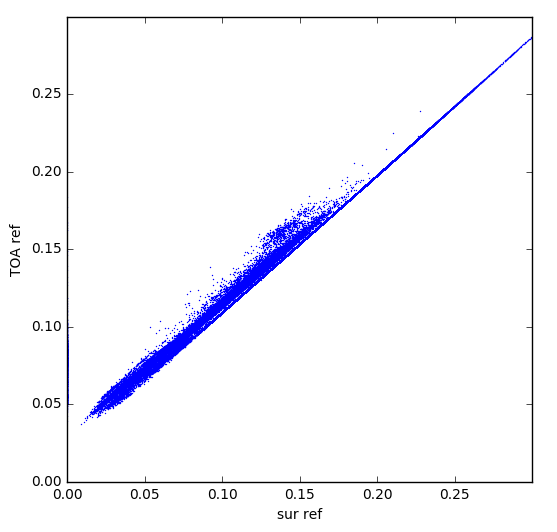

In [11]:
plt.figure(figsize=(6,6))
plt.plot(sr_b4.ravel(), toa_b4.ravel(), 'o', mew=0, ms=1)
plt.xlabel('sur ref')
plt.ylabel('TOA ref')
plt.xlim(0,0.3)
plt.ylim(0,0.3)

(0, 0.3)

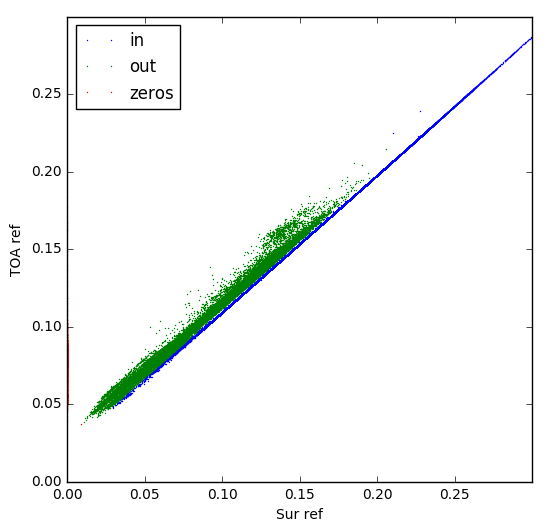

In [12]:
sr_in, toa_in, in_mask = ransaclin(sr_b4.ravel(), toa_b4.ravel())#get the values as well as the mask
in_mask = in_mask | (toa_b3.ravel()>0.2) # only focus on low reflectance pixels
zeros = (sr_b4.ravel()<0.01)
out_mask = (~in_mask) & (~zeros)
plt.figure(figsize=(6,6))
plt.plot(sr_b4.ravel()[in_mask], toa_b4.ravel()[in_mask], 'o', mew=0, ms=1, label='in')
plt.plot(sr_b4.ravel()[out_mask], toa_b4.ravel()[out_mask], 'o', mew=0, ms=1, label='out')
plt.plot(sr_b4.ravel()[zeros], toa_b4.ravel()[zeros], 'o', mew=0, ms=1, label='zeros')
plt.legend(loc = 'best')
plt.xlabel('Sur ref')
plt.ylabel('TOA ref')
plt.xlim(0,0.3)
plt.ylim(0,0.3)

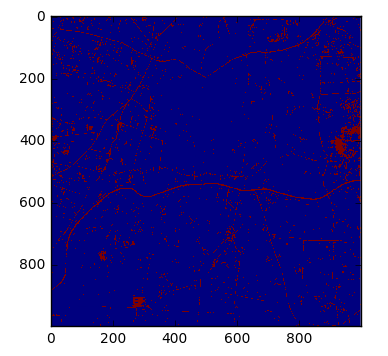

In [13]:
plt.imshow(out_mask.reshape(1000, 1000), interpolation='None') # plot the ouliers mask

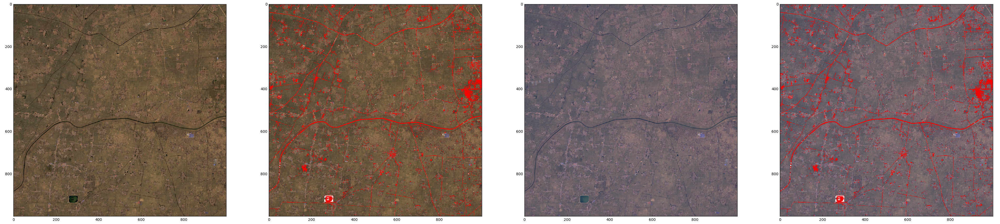

In [14]:
sur = np.array(sur_rgb).transpose(1,2,0)
toa = np.array(toa_rgb).transpose(1,2,0)
temp = sur.copy()
temp[(out_mask).reshape((1000,1000)),1:]=0 # use red to show those pixels
temp[(out_mask).reshape((1000,1000)),0]=1 # with outliers values
temp[(zeros).reshape((1000,1000)),:]=1 # show zeros surface reflectance pixels
temp1 = toa.copy()
temp1[(out_mask).reshape((1000,1000)),1:]=0
temp1[(out_mask).reshape((1000,1000)),0]=1
temp1[(zeros).reshape((1000,1000)),:]=1


fig = plt.figure(figsize=(48,12))
ax1 = fig.add_subplot(1,4,1)
ax1.imshow(sur*3, interpolation='None')
ax2 = fig.add_subplot(1,4,2)
ax2.imshow(temp*3, interpolation='None')
ax3 = fig.add_subplot(1,4,3)
ax3.imshow(toa*3, interpolation='None')
ax4 = fig.add_subplot(1,4,4)
ax4.imshow(temp1*3, interpolation='None')